In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
import geopandas as gpd
from shapely import wkt
import contextily as ctx
import optimiser as op
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [3]:
df =  pd.read_excel("./data/Demand_data.xlsx")
df['geometry']= df['geometry'].apply(wkt.loads)
poi_df = pd.read_excel("./data/Interest_points.xlsx")
potential_df = pd.read_excel("./data/Potential_charging_points.xlsx")
new_df = op.get_new_dataframe(df, poi_df)

Set parameter Username
Academic license - for non-commercial use only - expires 2023-10-15
Set parameter MIPGap to value 0.08
Set parameter TimeLimit to value 60
Gurobi Optimizer version 9.5.2 build v9.5.2rc0 (mac64[x86])
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 1526995 rows, 770801 columns and 3832457 nonzeros
Model fingerprint: 0xa01a1387
Model has 753424 quadratic constraints
Model has 8 general constraints
Variable types: 765593 continuous, 5208 integer (0 binary)
Coefficient statistics:
  Matrix range     [1e+00, 5e+04]
  QMatrix range    [1e+00, 1e+00]
  Objective range  [1e+00, 1e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [3e+00, 1e+06]
Presolve removed 1516145 rows and 6957 columns (presolve time = 5s) ...
Presolve removed 1514067 rows and 740279 columns
Presolve time: 7.23s
Presolved: 12928 rows, 30522 columns, 62250 nonzeros
Presolved model has 16296 SOS constraint(s)
Variable types: 23578 continuous, 694

In [4]:

gdf = gpd.GeoDataFrame(new_df,geometry='geometry',crs='EPSG:4326')
gdf=gdf.to_crs("EPSG:27700")

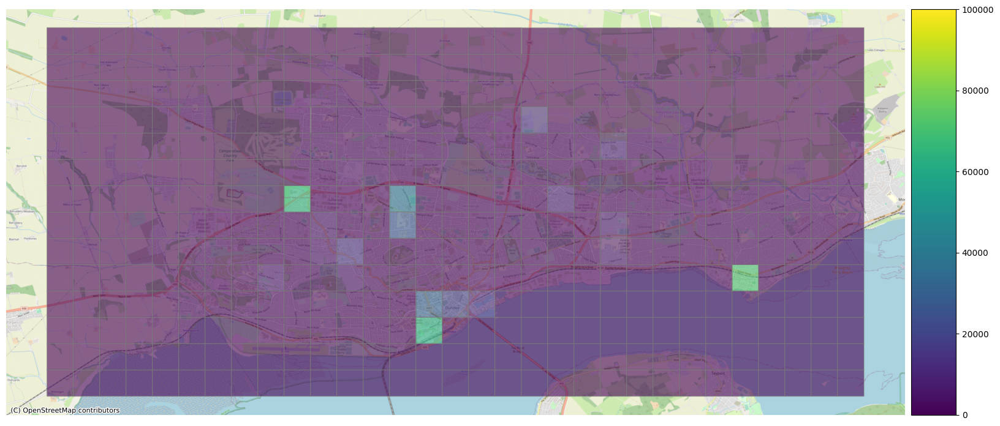

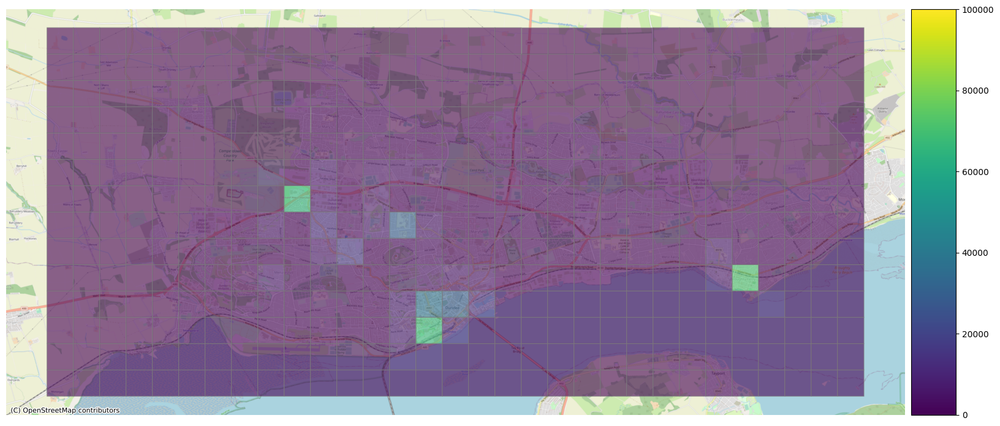

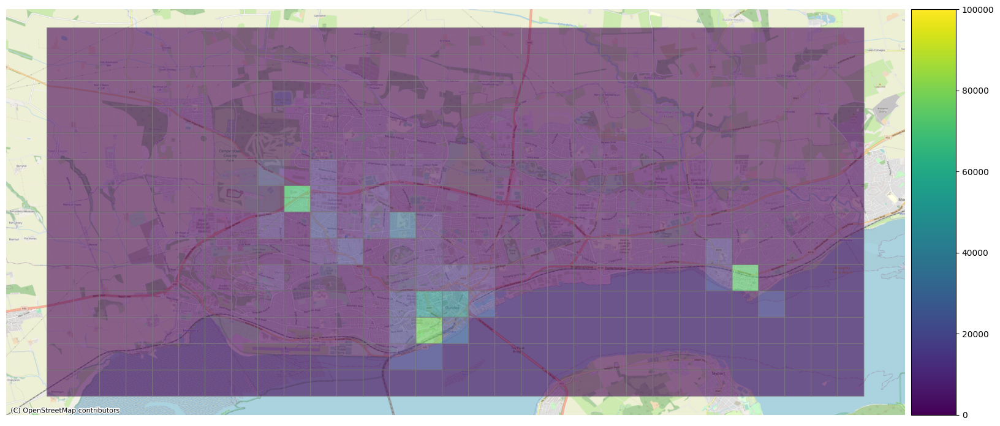

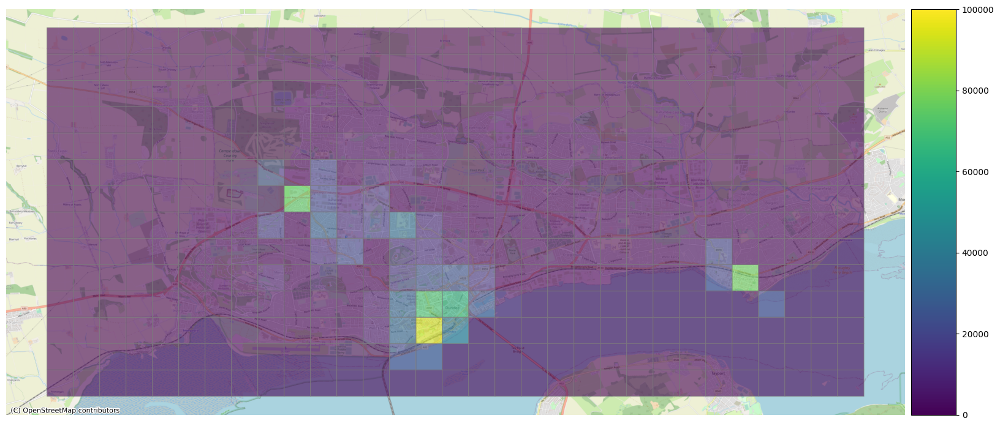

In [6]:
global_max = 100000
for t in range(4):
    fig, ax = plt.subplots(1, 1)
    fig.set_figheight(20)
    fig.set_figwidth(20)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    gdf.plot(ax=ax,column=f'Demand_{t}',cmap="viridis",edgecolor='grey',alpha=0.6, legend=True, cax=cax, vmax=global_max)
    ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    ax.axis('off')

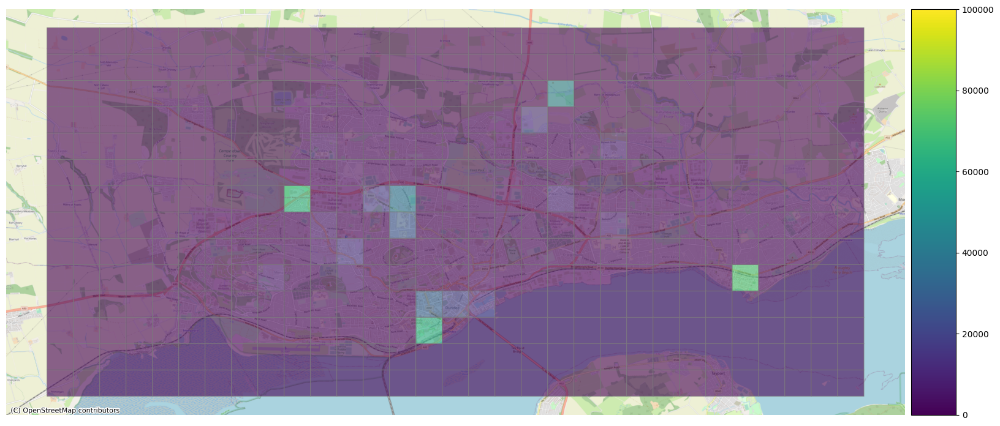

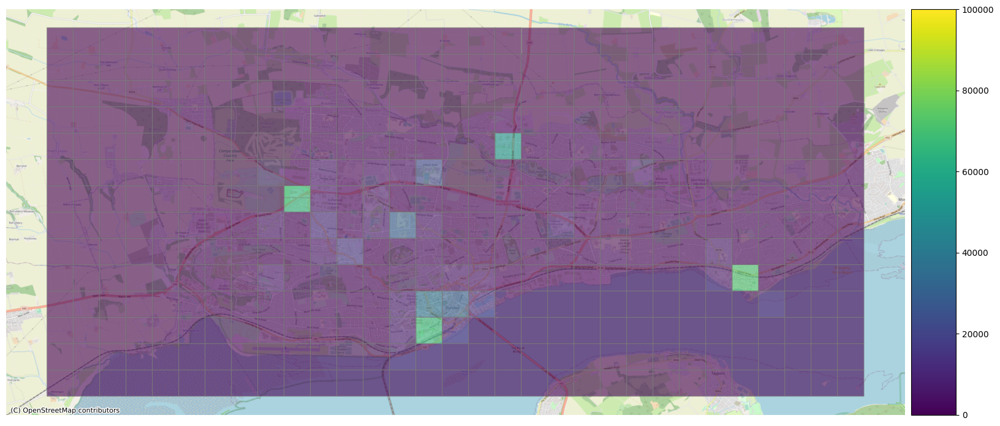

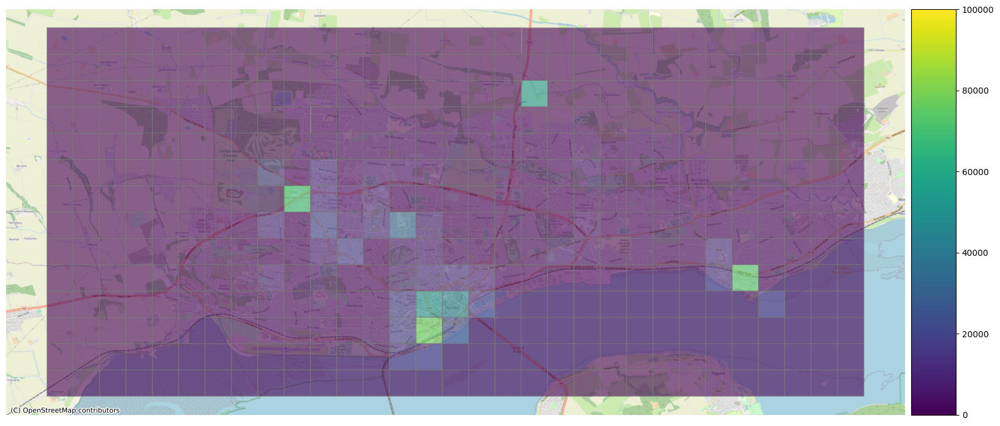

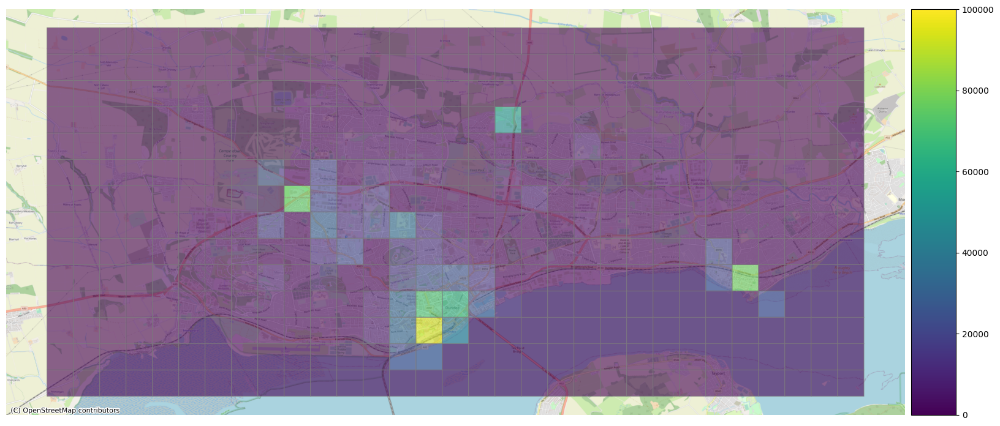

In [7]:
for t in range(4):
    fig, ax = plt.subplots(1, 1)
    fig.set_figheight(20)
    fig.set_figwidth(20)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    gdf.plot(ax=ax,column=f'Supply_{t}',cmap="viridis",edgecolor='grey',alpha=0.6, legend=True, cax=cax, vmax=global_max)
    ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    ax.axis('off')

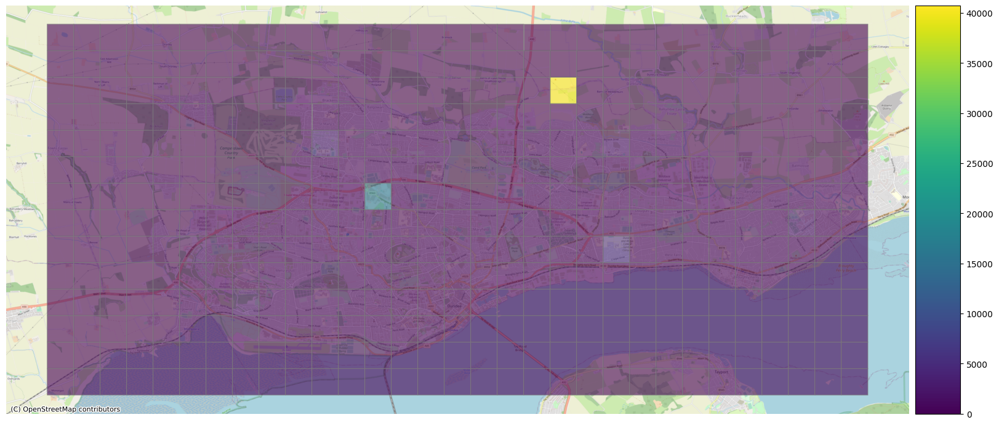

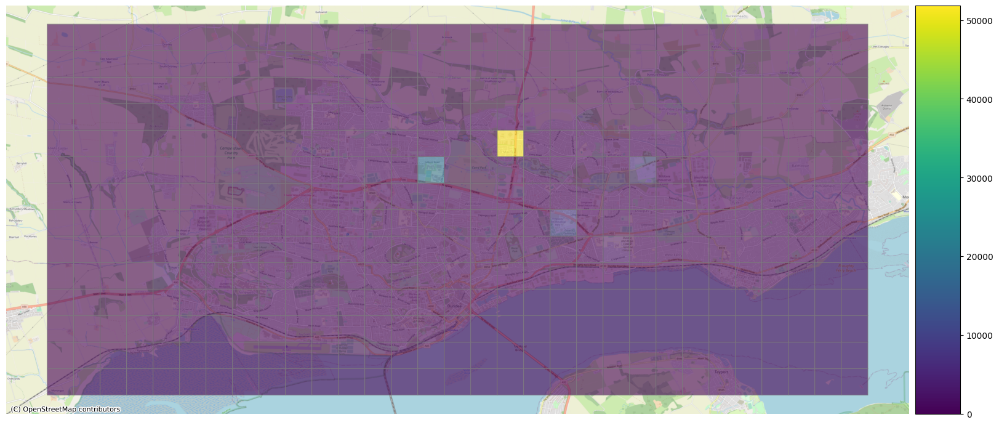

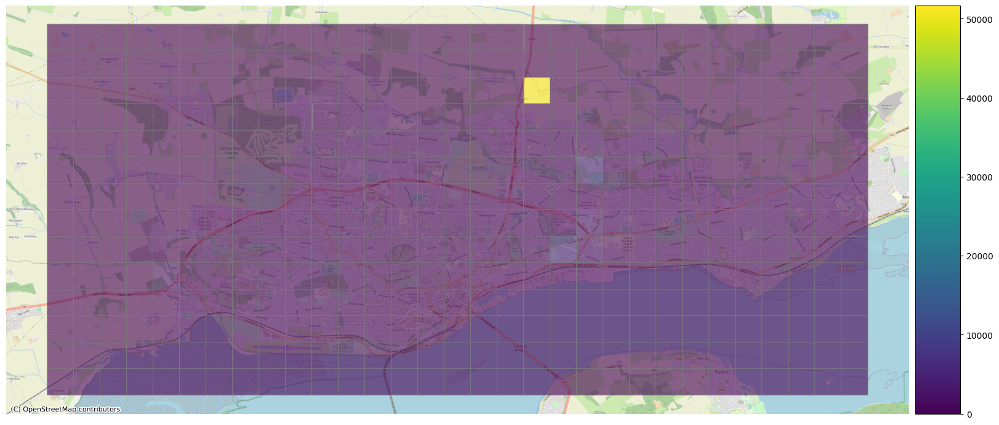

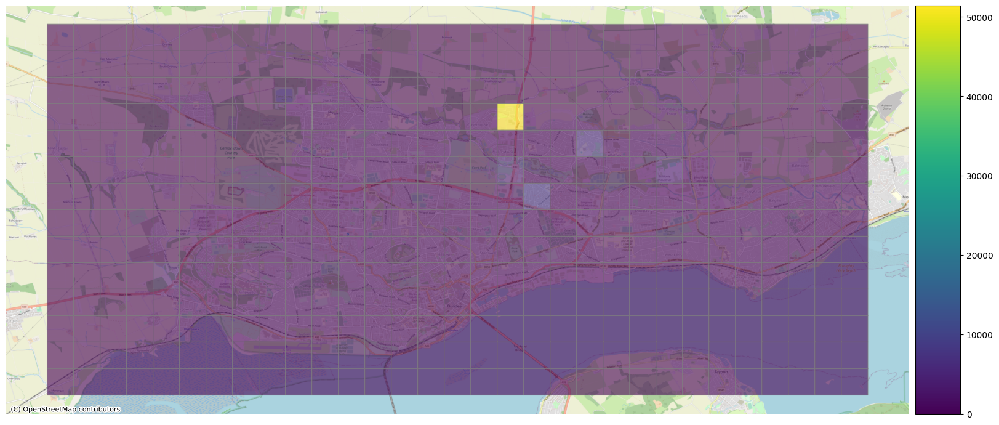

In [8]:
for t in range(4):
    fig, ax = plt.subplots(1, 1)
    fig.set_figheight(20)
    fig.set_figwidth(20)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    gdf.plot(ax=ax,column=f'Diff_{t}',cmap="viridis",edgecolor='grey',alpha=0.6, legend=True, cax=cax)
    ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    ax.axis('off')

In [ ]:
charging_capacity = {'Slow': 3500, 'Fast': 5200, 'Rapid': 50500}

for speed in charging_capacity.keys():
    fig, ax = plt.subplots(1, 1)
    fig.set_figheight(20)
    fig.set_figwidth(20)
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    gdf.plot(ax=ax,column=f'Number of {speed} Charging Points',cmap="viridis",edgecolor='grey',alpha=0.6, legend=True, cax=cax)
    ctx.add_basemap(ax,source=ctx.providers.OpenStreetMap.Mapnik,crs='EPSG:27700')
    ax.axis('off')